In [4]:
import torch
import torchvision.ops
from torch import nn
from PIL import Image
import torchvision.transforms as transforms
from util_kitti import load_tf_image
# Draw 2D bounding box on image 
import cv2
import time
import os
from util_kitti import init_img_plt, kitti_calib_file_parser
import random 
import copy
import numpy as np
from matplotlib import pyplot as plt
from math import sqrt
from math import atan2, pi, sin , cos

import sys
sys.path.insert(0, "/home/lab530/KenYu/visualDet3D/visualDet3D/networks/lib/")
from pac import xyz_2_uv, uvy_2_xyz, get_slope, PerspectiveConv2d

random.seed(2222)
NUM_IMAGE_SHOW = 25

# Image files 
IMG_DIR = "/home/lab530/KenYu/kitti/training/image_2/"
# Anotations files 
ANO_DIR = "/home/lab530/KenYu/kitti/training/label_2/"
# Calibration files
CAR_DIR = "/home/lab530/KenYu/kitti/training/calib/"

# 
BEV_SIZE = 400 # pixel
MAX_DIS = 60 # m
AVG_Y3D_CENTER = 0.94677


# Visualize PAC with 2d_offset, 3d_offset...


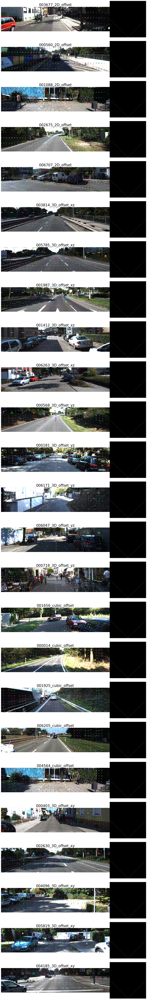

In [7]:
img_names = [i.split('.')[0] for i in os.listdir(IMG_DIR)]

random.shuffle(img_names)
chose_name = img_names[:NUM_IMAGE_SHOW]

# Transform image 
chose_img = []
chose_P2  = []
for i_name, name in enumerate(chose_name):
    img = load_tf_image(os.path.join(IMG_DIR, f"{name}.png"))

    img_ori_h, img_ori_w, _ = img.shape
    
    P2 = kitti_calib_file_parser(os.path.join(CAR_DIR, f"{name}.txt"),
                                 new_shape_tf = (288, 1280), 
                                 crop_tf = 100)
    cu, cv = (P2[0, 2], P2[1, 2])
    # print(f"Img.shape = {img.shape}")
    height, width, channel = img.shape
    
    for u in range(0, 1280, 128):
        for v in range(0, 288, 64):
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

            if i_name < NUM_IMAGE_SHOW//5:
                # Use Fix 2d offset
                dcx = 32
                dcy = 32
                chose_name[i_name] = name + "_2D_offset"
                slope = get_slope((u, v, AVG_Y3D_CENTER), P2)
                dsx = dcy - sqrt(1 + slope**2)
                for ui, vi in [(u-dcx-dsx, v-dsx*slope), (u-dsx, v-dsx*slope), (u+dcx-dsx, v-dsx*slope),
                            (u-dcx    , v          ), (u    , v          ), (u+dcx    , v          ),
                            (u-dcx+dsx, v+dsx*slope), (u+dsx, v+dsx*slope), (u+dcx+dsx, v+dsx*slope)]:
                    img = cv2.circle(img, (int(ui), int(vi)) , 1, color, 4)
                

            elif NUM_IMAGE_SHOW//5 <= i_name < 2*NUM_IMAGE_SHOW//5:
                # 3D_offset_xz
                dx = 0.2 # m
                dz = 1.0 # m
                chose_name[i_name] = name + "_3D_offset_xz"
                x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), P2)
                for xi, yi, zi in [(x-dx, y, z-dz), (x, y, z-dz), (x+dx, y, z-dz),
                                (x-dx, y, z   ), (x, y, z   ), (x+dx, y, z   ),
                                (x-dx, y, z+dz), (x, y, z+dz), (x+dx, y, z+dz)]:
                    img = cv2.circle(img, xyz_2_uv((xi, yi, zi), P2), 1, color, 4)
                

            elif 2*NUM_IMAGE_SHOW//5 <= i_name < 3*NUM_IMAGE_SHOW//5:
                # 3D_offset_yz
                dy = 0.5 # m
                dz = 1.0 # m
                chose_name[i_name] = name + "_3D_offset_yz"
                x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), P2)
                for i, (xi, yi, zi) in enumerate([(x, y-dy, z-dz), (x, y-dy, z), (x, y-dy, z+dz),
                                                (x, y   , z-dz), (x, y   , z), (x, y   , z+dz),
                                                (x, y+dy, z-dz), (x, y+dy, z), (x, y+dy, z+dz)]):
                    img = cv2.circle(img, xyz_2_uv((xi, yi, zi), P2), 1, color, 4)


            elif 3*NUM_IMAGE_SHOW//5 <= i_name < 4*NUM_IMAGE_SHOW//5:
                # Use Fix 2d offset
                dcx = 32
                dcy = 32
                chose_name[i_name] = name + "_cubic_offset"

                theta = atan2(cv - v, cu - u) - pi/2
                
                offset = np.array( [[-dcx,-dcy], [0,-dcy], [dcx,-dcy],
                                    [-dcx,   0], [0,   0], [dcx,   0],
                                    [-dcx, dcy], [0, dcy], [dcx, dcy]])
                
                rotate_offset = []
                for o in offset:
                    x, y = o[0], o[1]
                    rotate_offset.append( [x*cos(theta) - y*sin(theta) + u,
                                           x*sin(theta) + y*cos(theta) + v] )
                rotate_offset = np.array(rotate_offset)
                
                for ui, vi in rotate_offset:
                    img = cv2.circle(img, (int(ui), int(vi)) , 1, color, 4)

            else:
                # 3D_offset_xy
                dx = 0.4 # m
                dy = 0.4 # m
                chose_name[i_name] = name + "_3D_offset_xy"
                x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), P2)
                for i, (xi, yi, zi) in enumerate([(x-dx, y-dy, z), (x, y-dy, z), (x+dx, y-dy, z),
                                                  (x-dx, y   , z), (x, y   , z), (x+dx, y   , z),
                                                  (x-dx, y+dy, z), (x, y+dy, z), (x+dx, y+dy, z)]):
                    img = cv2.circle(img, xyz_2_uv((xi, yi, zi), P2), 1, color, 4)
        
    chose_P2.append(P2)
    chose_img.append(img)

axs = init_img_plt(chose_img, titles = chose_name)


# PAC Visualization 

In [6]:
from pac import xyz_2_uv, uvy_2_xyz, get_slope

class PerspectiveConv2d_tmp(nn.Module): # copy from pac.py
    def __init__(self,
                 in_channels,
                 out_channels,
                 mode,
                 conv_weight=None,
                 kernel_size=3,
                 stride=1,
                 padding=1,
                 bias=False,
                 offset_3d_xy_dx=0.4,
                 offset_3d_xy_dy=0.4,
                 is_zero_offset=False):

        super(PerspectiveConv2d_tmp, self).__init__()
        
        assert type(kernel_size) == tuple or type(kernel_size) == int

        kernel_size = kernel_size if type(kernel_size) == tuple else (kernel_size, kernel_size)
        self.stride = stride if type(stride) == tuple else (stride, stride)
        self.padding = padding
        self.mode = mode
        self.conv_weight = conv_weight
        self.is_zero_offset = is_zero_offset
        
        self.regular_conv = nn.Conv2d(in_channels=in_channels,
                                      out_channels=out_channels,
                                      kernel_size=kernel_size,
                                      stride=stride,
                                      padding=self.padding,
                                      bias=bias)
        print(f"self.regular_conv = {self.regular_conv.weight.shape}") # [1, 1, 3, 3]

        ##########################################
        ### Get perspective convolution offset ###
        ##########################################
        D_RATIO = 1 # Downsamle ratio
        # Import type A calibration file
        self.P2 = kitti_calib_file_parser(os.path.join(CAR_DIR, f"000169.txt"),
                                          new_shape_tf = (18, 80), 
                                          crop_tf = 100)

        # offset = np.zeros((1, 18, 288, 1280))
        offset = np.zeros((1, 18, 18, 80))
        for v_f_idx in range(18):
            for u_f_idx in range(80):
                v, u = v_f_idx * D_RATIO, u_f_idx * D_RATIO
                slope = get_slope((u, v, AVG_Y3D_CENTER), self.P2)
                
                if self.mode == '2d_offset': # Use Fix 2d offset
                    dcx = 32
                    dcy = 32
                    dsx = dcy - sqrt(1 + slope**2)
                    for i, i_o in enumerate( [-dsx*slope, -dcx-dsx,   -dsx*slope, -dsx,   -dsx*slope, dcx-dsx,
                                               0        , -dcx    ,    0  , 0         ,    0,         dcx    ,
                                               dsx*slope, -dcx+dsx,    dsx*slope,  dsx,    dsx*slope, dcx+dsx ] ):
                        offset[0, i, v_f_idx, u_f_idx] = i_o/D_RATIO

                elif self.mode == '3D_offset_xz':
                    dx = 0.4 # m
                    dz = 1 # m
                    x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), self.P2)
                    for i, (xi, yi, zi) in enumerate([(x-dx, y, z+dz), (x, y, z+dz), (x+dx, y, z+dz),
                                                      (x-dx, y, z   ), (x, y, z   ), (x+dx, y, z   ),
                                                      (x-dx, y, z-dz), (x, y, z-dz), (x+dx, y, z-dz)]):
                        ui, vi = xyz_2_uv((xi, yi, zi), self.P2)
                        offset[0, i*2  , v_f_idx, u_f_idx] = (vi-v)/D_RATIO
                        offset[0, i*2+1, v_f_idx, u_f_idx] = (ui-u)/D_RATIO
                
                elif self.mode == '3D_offset_yz':
                    dy = 0.5 # m
                    dz = 1.0 # m
                    x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), self.P2)
                    for i, (xi, yi, zi) in enumerate([(x, y-dy, z-dz), (x, y-dy, z), (x, y-dy, z+dz),
                                                      (x, y   , z-dz), (x, y   , z), (x, y   , z+dz),
                                                      (x, y+dy, z-dz), (x, y+dy, z), (x, y+dy, z+dz)]):
                        ui, vi = xyz_2_uv((xi, yi, zi), self.P2)
                        offset[0, i*2  , v_f_idx, u_f_idx] = (vi-v)/D_RATIO
                        offset[0, i*2+1, v_f_idx, u_f_idx] = (ui-u)/D_RATIO

                elif self.mode == '3D_offset_xy':
                    dx = offset_3d_xy_dx
                    dy = offset_3d_xy_dy
                    x, y, z = uvy_2_xyz((u, v, AVG_Y3D_CENTER), self.P2)
                    for i, (xi, yi, zi) in enumerate([(x-dx, y-dy, z), (x, y-dy, z), (x+dx, y-dy, z),
                                                      (x-dx, y   , z), (x, y   , z), (x+dx, y   , z),
                                                      (x-dx, y+dy, z), (x, y+dy, z), (x+dx, y+dy, z)]):
                        ui, vi = xyz_2_uv((xi, yi, zi), self.P2)
                        offset[0, i*2  , v_f_idx, u_f_idx] = (vi-v)/D_RATIO
                        offset[0, i*2+1, v_f_idx, u_f_idx] = (ui-u)/D_RATIO

                # add offset from regular convolution
                offset[0, :, v_f_idx, u_f_idx] -= np.array([-1,-1,  -1,0,  -1,1,
                                                             0,-1,   0,0,   0,1,
                                                             1,-1,   1,0,   1,1])
        
        if self.is_zero_offset:
            offset = np.zeros((1, 18, 18, 80))
        self.offset = torch.from_numpy(offset).type(torch.float32).cuda()

    def forward(self, x):
        B = x.shape[0]
        
        if self.conv_weight != None: 
            w = self.conv_weight
        else:
            w = self.regular_conv.weight
        
        x = torchvision.ops.deform_conv2d(input=x, 
                                          offset=self.offset[:B, :, :, :],
                                          weight=w, 
                                          bias=self.regular_conv.bias, 
                                          padding=self.padding,
                                          mask=None,
                                          stride=self.stride,)
        return x

img = load_tf_image(os.path.join(IMG_DIR, f"000169.png"))
img_ori_h, img_ori_w, _ = img.shape

image_transforms = transforms.Compose([
    transforms.Resize((288, 1280)), # (288, 1280), (18, 80)
    transforms.Grayscale(),
    transforms.ToTensor(),
])
img_i = Image.open('/home/lab530/KenYu/kitti/training/image_2/000169.png')
img_i = image_transforms(img_i)
img_i = torch.unsqueeze(img_i, 0).cuda()

print(f"Input Image: ")
print(img_i.shape)
conv_weight = torch.tensor( [[ [ [1.0, 0.0, -1.0,],
                                [1.0, 0.0, -1.0,],
                                [1.0, 0.0, -1.0,],]]] ).cuda()
print(f"conv_weight = {conv_weight.shape}")
pac_trival = PerspectiveConv2d_tmp(1, 1, "3D_offset_xy", conv_weight = None, is_zero_offset=True).cuda()
pac        = PerspectiveConv2d_tmp(1, 1, "3D_offset_xy", conv_weight = None, is_zero_offset=False).cuda()
img_o1 = pac_trival(img_i)
img_o2 = pac       (img_i)

print(f"Output Image :")
# print(img_o.shape)

img_i = img_i[0].permute(1,2,0).cpu().detach().numpy()
img_o1 = img_o1[0].permute(1,2,0).cpu().detach().numpy()
img_o2 = img_o2[0].permute(1,2,0).cpu().detach().numpy()

print(img.shape)

axs = init_img_plt([img, img_i, img_o1, img_o2], titles = ["Original", "img_input", "output1", "output2"])



Input Image: 
torch.Size([1, 1, 288, 1280])
conv_weight = torch.Size([1, 1, 3, 3])
self.regular_conv = torch.Size([1, 1, 3, 3])
self.regular_conv = torch.Size([1, 1, 3, 3])


RuntimeError: offset output dims: (18, 80) - computed output dims: (288, 1280)